In [1]:
include("../src/HDC.jl")
include("../src/math.jl")
include("../src/experimental.jl")
using DataFrames
using CSV
using JLD
using MySQL
using Distributions
using ThreadSafeDicts

# Create real valued embeddings
Start values between -1 and 1

## esm bow

In [2]:
aa_embeddings = DataFrame(CSV.File("../data/amino_acid_embeddings.csv"))
amino_acids_esm = [only(i) for i in aa_embeddings.protein_ID]
aa_emb = Matrix(aa_embeddings[:, 2:end])
# Create HDVs
HDV_mat_bit = nested_arrays2mat([hdv() for i in 1:size(aa_emb)[2]], true)
# Extend embeddings into hyperdimensional space
AA_bit_esm = permutedims(mat_scaler(aa_emb * HDV_mat_bit, -5, 5, 2))

AA_dict = Dict(zip(amino_acids_esm, [AA_bit_esm[:, i] for i in 1:21]))

Dict{Char, Vector{Float64}} with 21 entries:
  'P' => [5.0, -2.01135, 0.764236, -1.3777, -3.78598, -5.0, -5.0, 2.30017, -0.1…
  'K' => [1.15607, 1.51767, 5.0, -2.17421, -1.89471, 1.89825, -3.77221, 0.11476…
  'M' => [0.988657, -0.216753, -0.477012, 0.546272, -0.199169, 2.54122, 4.2621,…
  'F' => [-5.0, -1.16816, 0.0664451, 5.0, -0.0817291, 1.68123, -1.01637, 3.1206…
  'I' => [-2.6111, -5.0, 1.37172, 1.68264, -4.46247, 4.45999, -4.80908, -5.0, 0…
  'H' => [0.989009, -1.22295, 0.0615186, 2.34681, -1.52165, -2.74021, 4.04473, …
  'E' => [1.15739, -0.930065, 1.39032, 0.240974, 3.04109, 2.1154, 3.24183, -0.2…
  'W' => [4.98696, -0.988325, 3.48643, -2.1254, -2.70021, -1.00366, 3.57621, -0…
  'S' => [2.23244, -0.925892, 1.59737, -0.233444, -3.82805, -0.591123, 2.45568,…
  'T' => [-2.51286, 1.12606, 3.0455, -5.0, 5.0, 0.883334, -4.86717, 3.99836, 1.…
  'C' => [1.64255, -1.4843, -5.0, 0.154584, 2.23398, -0.863899, 3.55391, 1.0931…
  'X' => [-1.16512, -1.45577, 1.08503, -1.40111, 2.91605, 5.0, -

In [3]:
trimer_hdvs = Dict(aa1 * aa2 * aa3 => 
AA_dict[aa1] .* circshift(AA_dict[aa2], 1) .* circshift(AA_dict[aa3], 2)
for aa1 in amino_acids_esm for aa2 in amino_acids_esm  for aa3 in amino_acids_esm)

Dict{String, Vector{Float64}} with 9261 entries:
  "HTY" => [0.0598946, 0.0365266, -0.0709891, -23.6815, -4.82604, -23.2654, -17…
  "DRR" => [-0.686351, -0.838665, 0.100266, 0.00284849, 0.0280628, -4.33547, -7…
  "QAM" => [1.95507, 0.126668, 3.26087, -1.0309, -0.0992326, 1.77478, -0.90823,…
  "WNG" => [-2.5976, 10.2925, -2.8625, 2.9646, 13.8965, -6.45259, -11.1941, 0.1…
  "PPV" => [-21.8464, -50.2838, -4.56096, -5.26443, -24.2957, -20.0423, 40.6037…
  "WMA" => [67.3821, 1.61485, -0.0361011, 1.68263, 6.7692, -0.329717, 7.73367, …
  "TKL" => [-11.5714, -4.95756, -12.7463, 90.9162, 20.0317, -5.16603, -18.4104,…
  "MSW" => [-3.89907, 1.35289, 2.20255, -0.862413, 0.162101, 20.6758, 6.80299, …
  "XTY" => [-0.0705598, 0.0434803, -1.25206, 14.1385, 9.2485, 42.452, 9.12203, …
  "ETI" => [0.209236, -11.6856, -4.08791, -3.66943, -20.8576, 17.7972, -12.7788…
  "KLF" => [-1.53983, 9.77789, 90.9162, -4.68002, -0.388593, 18.9128, -0.137732…
  "AGI" => [0.61536, -39.8263, -7.75288, 15.3593, -4.48508, 

In [9]:
function bow_embedder(sequence)
    l = [trimer_hdvs[sequence[i:i+2]] for i in 1:length(sequence)-2]
    v = reduce(.+, l)
    v = v ./ norm(v)
    return v
end

bow_embedder (generic function with 1 method)

In [6]:
non_ml = JLD.load("../data/phalp_non_ml.jld")["up_evd_type"]
conn = DBInterface.connect(MySQL.Connection, "127.0.0.1", "root", "DB_Pw123", db = "PhaLP")
data = DataFrame(DBInterface.execute(conn,"SELECT * FROM PhaLP.UniParc;"))
seq = Dict(zip(data[:, 1],data[:,2]))

Dict{String, Vector{UInt8}} with 11549 entries:
  "UPI000178DD30" => [0x4d, 0x41, 0x4b, 0x56, 0x51, 0x46, 0x54, 0x4b, 0x52, 0x5…
  "UPI0013EFDC93" => [0x4d, 0x47, 0x59, 0x4d, 0x59, 0x50, 0x56, 0x50, 0x4b, 0x4…
  "UPI000172D062" => [0x4d, 0x56, 0x49, 0x4d, 0x53, 0x45, 0x46, 0x56, 0x57, 0x4…
  "UPI001463ABBB" => [0x4d, 0x4e, 0x4c, 0x53, 0x41, 0x4e, 0x46, 0x53, 0x4c, 0x4…
  "UPI000232F56D" => [0x4d, 0x41, 0x4c, 0x47, 0x41, 0x50, 0x4d, 0x45, 0x4e, 0x4…
  "UPI0011625D30" => [0x4d, 0x45, 0x47, 0x47, 0x44, 0x4b, 0x4c, 0x51, 0x47, 0x4…
  "UPI0009882324" => [0x4d, 0x44, 0x49, 0x44, 0x52, 0x4e, 0x52, 0x4c, 0x52, 0x5…
  "UPI000CA1D611" => [0x4d, 0x4b, 0x51, 0x41, 0x41, 0x59, 0x47, 0x53, 0x4c, 0x5…
  "UPI0006BC2F8A" => [0x4d, 0x53, 0x46, 0x4b, 0x4d, 0x4b, 0x59, 0x50, 0x49, 0x4…
  "UPI000BBF7878" => [0x4d, 0x54, 0x45, 0x52, 0x56, 0x4c, 0x52, 0x59, 0x44, 0x4…
  "UPI00138B2696" => [0x4d, 0x51, 0x4c, 0x53, 0x52, 0x4b, 0x47, 0x4c, 0x44, 0x4…
  "UPI00025D6AED" => [0x4d, 0x53, 0x4e, 0x52, 0x4e, 0x49, 0x5

In [12]:
embedded_bow_esm = Dict()
non_ml_seq = collect(keys(non_ml))

for i in non_ml_seq
    new_seq = bow_embedder(String(seq[i]))
    embedded_bow_esm[i] = new_seq
end
@save "../data/phalp_bow_esm_realnorm.jld" embedded_bow_esm

## ESM convolutional

In [7]:
data = DataFrame(DBInterface.execute(conn,"SELECT * FROM PhaLP.UniParc;"))
seq = Dict(zip(data[:, 1],data[:,2]))

function convolved_embedding(sequence, tokens, k=3)
    # layer 1
    kmer_hdvs = []
    for i in 1:length(sequence)-k+1
        kmer = sequence[i:i+k-1]
        aa_hdvs = [circshift(tokens[aa], k-l) for (l, aa) in enumerate(kmer)]
        push!(kmer_hdvs, reduce(.*, aa_hdvs))
    end
    
    # layer 2
    conv_kmer_hdvs = []
    for i in 1:length(kmer_hdvs)-k+1
        convolved_kmers = kmer_hdvs[i:i+k-1]
        conv_hdvs = [circshift(convolved_kmers[l], k-l) for (l, km) in enumerate(convolved_kmers)]
        push!(conv_kmer_hdvs, reduce(.*, conv_hdvs))
    end
    v = reduce(.+, conv_kmer_hdvs)
    v = v/norm(v)
    return v
end

embedded_CNN_esm = Dict()
non_ml_seq = collect(keys(non_ml))
for i in non_ml_seq
    sequence = String(seq[i])
    new_seq = convolved_embedding(sequence, AA_dict)
    embedded_CNN_esm[i] = new_seq
end

In [8]:
@save "../data/phalp_cnn_esm_realnorm.jld" embedded_CNN_esm

## Random real bow

In [10]:
data = DataFrame(DBInterface.execute(conn,"SELECT * FROM PhaLP.UniParc;"))
seq = Dict(zip(data[:, 1],data[:,2]))
AA_list = ['A','C','D','E','F','G','H','I','K','L','M','N','P','Q','R','S','T','V','W','Y', 'X']

AA_dict = Dict(zip(AA_list, [rand(Uniform(-1,1),10000) for i in AA_list]))

Dict{Char, Vector{Float64}} with 21 entries:
  'M' => [0.760729, 0.948057, -0.259074, 0.363876, 0.938576, 0.816207, 0.107842…
  'K' => [-0.064849, 0.367841, -0.958804, -0.84831, -0.111581, -0.63059, -0.602…
  'P' => [-0.540336, 0.906122, -0.421923, -0.902524, -0.217447, -0.536296, -0.9…
  'Q' => [0.307408, -0.893928, 0.339809, -0.140319, 0.890231, 0.716879, 0.88593…
  'I' => [0.935789, -0.569855, -0.876983, -0.732348, -0.863926, -0.967839, -0.8…
  'H' => [0.29521, -0.233525, -0.994751, -0.665679, -0.510863, -0.442295, 0.403…
  'E' => [-0.320252, -0.595818, -0.593355, 0.402707, -0.725445, -0.171306, 0.50…
  'W' => [-0.310054, 0.0347303, 0.597392, 0.444548, 0.173916, 0.277489, -0.8540…
  'S' => [0.160738, -0.20289, -0.151288, -0.76397, -0.366145, 0.456236, -0.1112…
  'T' => [-0.679959, -0.238833, 0.944513, -0.364207, -0.261525, -0.804811, 0.73…
  'C' => [-0.0175568, -0.476332, 0.776118, -0.851406, 0.973762, -0.983836, 0.16…
  'X' => [-0.97943, -0.545351, 0.396708, -0.493378, -0.701934, 0

In [11]:
trimer_hdvs = Dict(aa1 * aa2 * aa3 => 
AA_dict[aa1] .* circshift(AA_dict[aa2], 1) .* circshift(AA_dict[aa3], 2)
for aa1 in AA_list for aa2 in AA_list  for aa3 in AA_list)


function bow_embedder(sequence)
    l = [trimer_hdvs[sequence[i:i+2]] for i in 1:length(sequence)-2]
    v = reduce(.+, l)
    v = v/norm(v)
    return v
end

bow_embedder (generic function with 1 method)

In [12]:
embedded_bow_rand = Dict()
non_ml_seq = collect(keys(non_ml))

for i in non_ml_seq
    new_seq = bow_embedder(String(seq[i]))
    embedded_bow_rand[i] = new_seq
end
@save "../data/phalp_bow_rand_realnorm.jld" embedded_bow_rand

## Random real cnn


In [13]:
data = DataFrame(DBInterface.execute(conn,"SELECT * FROM PhaLP.UniParc;"))
seq = Dict(zip(data[:, 1],data[:,2]))

embedded_CNN_rand = Dict()
non_ml_seq = collect(keys(non_ml))
for i in non_ml_seq
    sequence = String(seq[i])
    new_seq = convolved_embedding(sequence, AA_dict)
    embedded_CNN_rand[i] = new_seq
end

@save "../data/phalp_cnn_rand_realnorm.jld" embedded_CNN_rand

## Load

In [1]:
using JLD
phalp_cnn_rand = load("../data/phalp_cnn_rand_real.jld")["embedded_CNN_rand"]
phalp_bow_rand = load("../data/phalp_bow_rand_real.jld")["embedded_bow_rand"]
phalp_bow_esm = load("../data/phalp_bow_esm_real.jld")["phalp_bow_esm"]
phalp_cnn_esm = load("../data/phalp_cnn_esm_real.jld")["embedded_CNN_esm"]
up2type = JLD.load("../data/phalp_type.jld")["up2type"]

Dict{String, Union{Missing, String}} with 11549 entries:
  "UPI000178DD30" => "endolysin"
  "UPI0013EFDC93" => "endolysin"
  "UPI000172D062" => "VAL"
  "UPI001463ABBB" => "endolysin"
  "UPI000232F56D" => "endolysin"
  "UPI0011625D30" => "VAL"
  "UPI0009882324" => "endolysin"
  "UPI000CA1D611" => "VAL"
  "UPI0006BC2F8A" => "endolysin"
  "UPI000BBF7878" => "endolysin"
  "UPI00138B2696" => "endolysin"
  "UPI00025D6AED" => "endolysin"
  "UPI0010C2D3EE" => "endolysin"
  "UPI000D22144F" => "VAL"
  "UPI0018623B24" => "endolysin"
  "UPI00080F0655" => "endolysin"
  "UPI00022BD3A3" => "endolysin"
  "UPI0008093543" => "endolysin"
  "UPI001463E938" => "VAL"
  ⋮               => ⋮

In [2]:
include("../src/HDC.jl")
include("../src/math.jl")
include("../src/experimental.jl")
using MLJ
using MLDataPattern
using DataFrames
using XGBoost
using MLJXGBoostInterface
using Plots
using MultivariateStats
using MLJBase
using Printf
using UMAP
using ThreadSafeDicts
using MLJ


## Plots

In [3]:
new = filter(x -> (first(x) in collect(keys(phalp_cnn_esm))), up2type)
val = filter(x -> (last(x) == "VAL"), new)
endo = filter(x -> (last(x) == "endolysin"), new)

Dict{String, Union{Missing, String}} with 2803 entries:
  "UPI000178DD30" => "endolysin"
  "UPI0012B4B15F" => "endolysin"
  "UPI0013EFDC93" => "endolysin"
  "UPI000201BE9F" => "endolysin"
  "UPI000232F56D" => "endolysin"
  "UPI000DF0A1E1" => "endolysin"
  "UPI00138B2696" => "endolysin"
  "UPI000012EA4B" => "endolysin"
  "UPI000178C353" => "endolysin"
  "UPI001436E76F" => "endolysin"
  "UPI000F6BA7D8" => "endolysin"
  "UPI00001A38F6" => "endolysin"
  "UPI00001A9BAB" => "endolysin"
  "UPI001435C02C" => "endolysin"
  "UPI0010B96635" => "endolysin"
  "UPI0015F22725" => "endolysin"
  "UPI000D7DCFA8" => "endolysin"
  "UPI0010B8D78B" => "endolysin"
  "UPI000EB70E47" => "endolysin"
  ⋮               => ⋮

In [20]:
function plot_seq(embeddings, name)
    Keys = [key for (key, val) in new]
    key_seq = nested_arrays2mat([embeddings[i] for i in Keys], true) # change emebeddings here
    Values = [val for (key, val) in new]

    PCA_fit= MultivariateStats.fit(PCA, key_seq; maxoutdim=2)
    proj= projection(PCA_fit)

    types = collect(Set(Values))
    indices = [[j for j in 1:length(Values) if Values[j] == i] for i in types]

    colors = [:green, :red]
    fig = Plots.plot()

    for i in 1:2
        scatter!(fig, (proj[indices[i], 1], proj[indices[i], 2]), label=types[i], mc = colors[i])
    end

    dir = @sprintf("../thesis/Fig/%snorm.png", name)
    savefig(dir)
    return [fig,PCA_fit]
end

plot_seq (generic function with 1 method)

In [4]:
function umap_seq(embeddings, name, n_neighbors=15)
    Keys = [key for (key, val) in new]
    key_seq = Float64.(nested_arrays2mat([embeddings[i] for i in Keys])) # change emebeddings here
    Values = [val for (key, val) in new]

    umapfit = umap(key_seq, 2;n_neighbors)

    types = collect(Set(Values))
    indices = [[j for j in 1:length(Values) if Values[j] == i] for i in types]

    colors = [:green, :red]
    fig = Plots.plot()

    for i in 1:2
        scatter!(fig, (umapfit[1,indices[i]], umapfit[2,indices[i]]), label=types[i], mc = colors[i])
    end

    dir = @sprintf("../thesis/Fig/%sUnorm.png", name)
    savefig(dir)
    return fig
end


umap_seq (generic function with 2 methods)

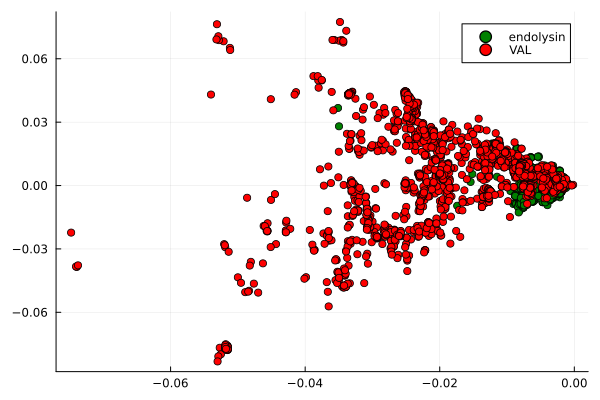

In [22]:
phalp_bow_esm_pca = plot_seq(phalp_bow_esm, "phalp_bow_esm_realnorm")
phalp_bow_esm_pca[1]

In [23]:
phalp_bow_esm_pca[2]

PCA(indim = 4829, outdim = 2, principalratio = 0.5729106687479305)

Pattern matrix (unstandardized loadings):
──────────────────────────────
             PC1           PC2
──────────────────────────────
1      0.561873    0.0552987
2      2.39431    -0.357495
3      2.42413    -0.468377
4      2.20943     0.516722
5      3.64457     1.51532
6      1.97405    -0.0909405
7      9.23648     3.15091
8     11.0504      2.47091
9      1.09366    -0.596602
10     0.70374     0.229684
11     1.33082     0.355796
12     8.65895     4.59332
13     7.63833     0.234623
14     3.36878     1.48302
15     8.98878    -2.4863
16     7.89171    -1.07427
17     2.71986     1.22805
18     2.78951     1.15977
19     7.2949     -0.0388515
20    11.8939     -5.05575
21     0.678569    0.200899
22     0.753866    0.348455
23     6.99609     0.541364
24    12.739      -4.79169
25     0.578675    0.0481483
26     1.95096     0.665618
27     0.935975    0.0492331
28     2.33397    -0.0580236
29     0.697098    

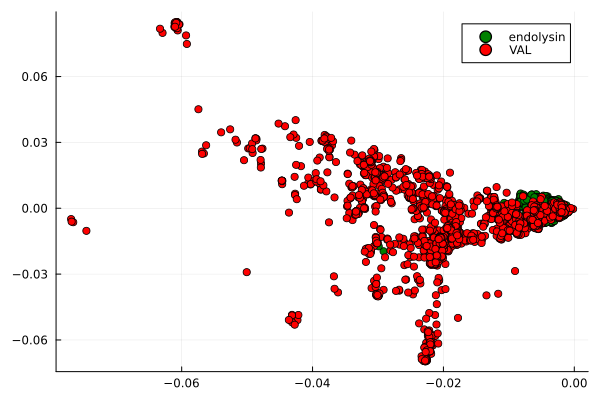

In [24]:
phalp_bow_rand_pca = plot_seq(phalp_bow_rand, "phalp_bow_rand_real")
phalp_bow_rand_pca[1]

In [26]:
phalp_bow_rand_pca[2]

PCA(indim = 4829, outdim = 2, principalratio = 0.3048879596812644)

Pattern matrix (unstandardized loadings):
──────────────────────────────
             PC1           PC2
──────────────────────────────
1      0.342874    0.0980217
2      1.36692    -0.148141
3      1.38769    -0.180612
4      1.08627     0.359219
5      1.76252     0.563909
6      1.03584    -0.0498788
7      5.2673      1.35348
8      6.96821     1.68106
9      0.768616   -0.269667
10     0.385111    0.142934
11     0.792969    0.217158
12     5.04573     5.61797
13     4.72392     0.779298
14     1.67069     0.497795
15     6.95208    -1.79046
16     5.00487    -0.44515
17     1.09069     0.338677
18     1.29346     0.688721
19     4.9877     -0.145081
20     8.47312    -2.69363
21     0.482925    0.068271
22     0.378312    0.179004
23     4.59647     1.05989
24     9.81905    -3.01288
25     0.389369    0.108938
26     1.0268      0.227068
27     0.594811   -0.0111622
28     1.37822    -0.000548053
29     0.37058 

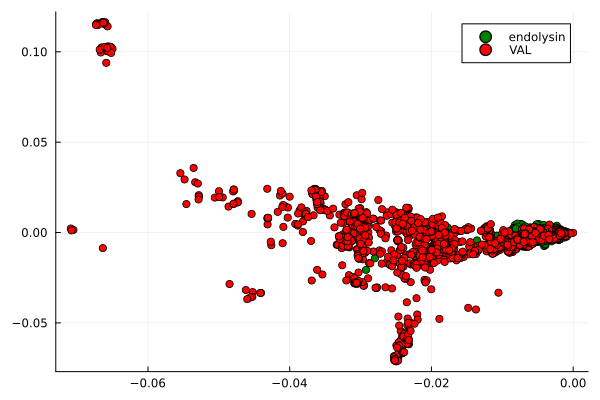

In [27]:
phalp_cnn_esm_pca = plot_seq(phalp_cnn_esm, "phalp_cnn_esm_real")
phalp_cnn_esm_pca[1]

In [28]:
phalp_cnn_esm_pca[2]

PCA(indim = 4829, outdim = 2, principalratio = 0.19631760038676255)

Pattern matrix (unstandardized loadings):
───────────────────────────────
              PC1           PC2
───────────────────────────────
1     0.0232631    -0.00144562
2     0.131373      0.000914644
3     0.150877     -0.00338512
4     0.0923333     0.0305183
5     0.158158      0.0790812
6     0.0920223     0.0157923
7     0.449198      0.158846
8     0.57811       0.100385
9     0.0670911    -0.01621
10    0.0247918     0.00968297
11    0.0540705     0.0127449
12    0.486039      0.632923
13    0.421387      0.0495676
14    0.150005      0.0594576
15    0.611106     -0.0931587
16    0.424568     -0.0221582
17    0.124107      0.0415584
18    0.140325      0.0614856
19    0.45397      -0.0193503
20    0.718631     -0.21683
21    0.0383876     0.0117112
22    0.0328404     0.0104534
23    0.399249      0.0874055
24    0.848722     -0.216993
25    0.0252669    -0.00508638
26    0.0775905     0.0430769
27    0.039987 

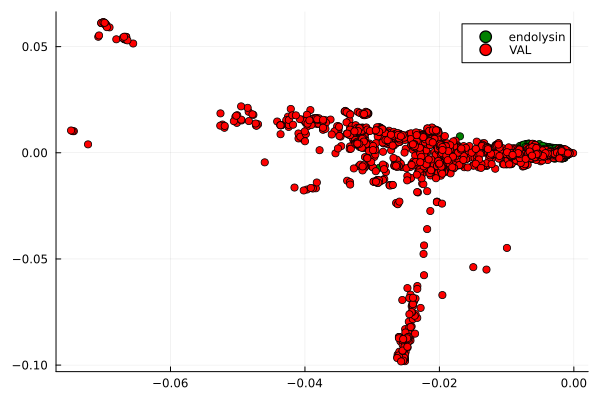

In [29]:
phalp_cnn_rand_pca = plot_seq(phalp_cnn_rand, "phalp_rand_esm_real")
phalp_cnn_rand_pca[1]

In [30]:
phalp_cnn_rand_pca[2]

PCA(indim = 4829, outdim = 2, principalratio = 0.1609152241859186)

Pattern matrix (unstandardized loadings):
──────────────────────────────
             PC1           PC2
──────────────────────────────
1     0.0233434    0.000255398
2     0.0928762   -0.0145335
3     0.102841    -0.00855663
4     0.0750568    0.00676042
5     0.121177     0.0237465
6     0.067556    -0.00226416
7     0.403398     0.0509135
8     0.577614     0.05493
9     0.0633838   -0.0155951
10    0.026053     0.00685373
11    0.0518986    0.00744431
12    0.455109     0.852124
13    0.393802    -0.00214459
14    0.130102     0.012302
15    0.552093    -0.163226
16    0.38476     -0.052377
17    0.0704169    0.0301377
18    0.110753     0.025916
19    0.414466    -0.0412697
20    0.688679    -0.138771
21    0.0359879    0.0119505
22    0.0275772    0.00317856
23    0.411822    -0.070888
24    0.708061    -0.177048
25    0.0258338   -0.000915167
26    0.0601945    0.00747229
27    0.0470905   -0.00450534
28    0.100

UMAP kapot?

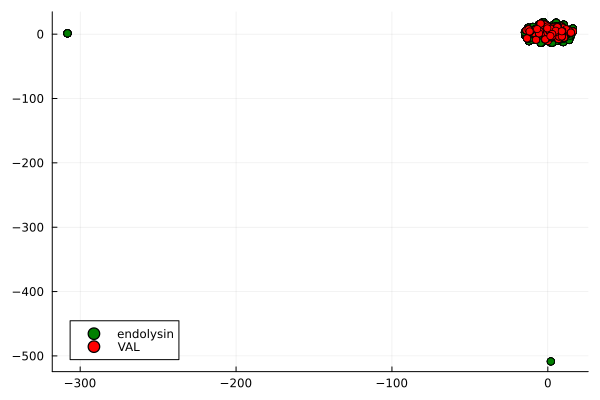

In [5]:
umap_seq(phalp_bow_esm, "phalp_bow_esm_real")

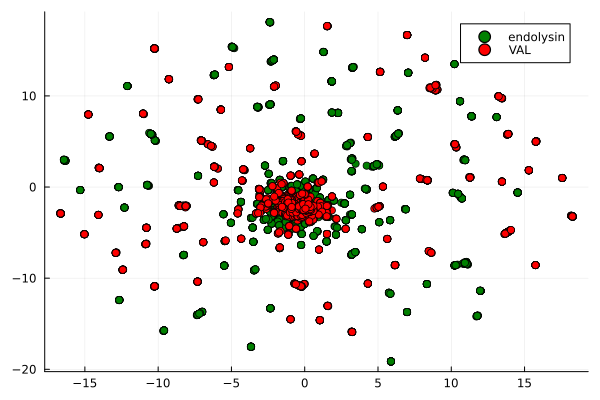

In [6]:
umap_seq(phalp_cnn_esm, "phalp_cnn_esm_real")

┌ Info: Arpack.XYAUPD_Exception(1)
│ Error encountered in spectral_layout; defaulting to random layout
└ @ UMAP /home/mfat/.julia/packages/UMAP/owv5b/src/embeddings.jl:12


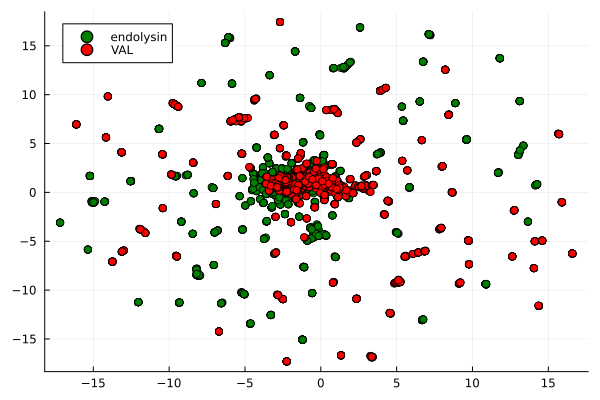

In [7]:
umap_seq(phalp_bow_rand, "phalp_bow_rand_real")

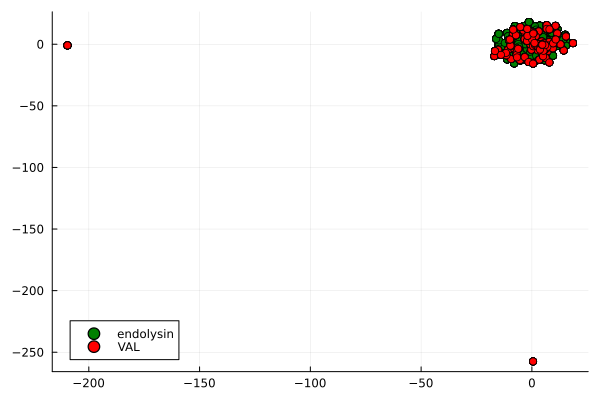

In [8]:
umap_seq(phalp_cnn_rand, "phalp_cnn_rand_real")

## OnlineHD